# **_Exploratory Data Analysis of Divvy-Bike Sharing_** #                                                                     
**by Aswin Pushkar**                                                                                 
![Divvy_Trips](https://i.imgur.com/7eGnPA6.png)





**_We dare you to bike it all_**                                             
Divvy is the bicycle sharing system in the Chicago metropolitan area, currently serving the cities of Chicago and Evanston. The system is owned by the Chicago Department of Transportation and has been operated by Lyft since 2019. As of Sept 2021, Divvy operated 16,500 bicycles and over 800 stations, covering 190 square miles  

 The bikes can be unlocked from one station and returned to any other station in the system.Divvy is available for use 24 hours a day, 7 days a week, 365 days a year.Recently, Divvy e-scooters have made their way into the Loop, using the same docking stations that are already used for Divvy bikes.0 Divvy is now the first docked micromobility system in the nation that can accommodate bikes, ebikes, and scooters all in the same stations.The hybrid ebike allows riders to dock at any Divvy station or use the cable to lock to any e-station. They can also lock to a public bike rack within the service area for an extra $2.
                                      
With more than 400 miles of bike lanes throughout Chicago and Evanston, Divvy is the best way to see the town.
This projects talks about the type of ride preferred by users and the time of the year and days of the week and hour of the day where the usage peaks .The data along with the graph helps to analyze the average distance and duration of usage over 2020.

## _What is Exploratory Data Analysis?_ ##
![eda](https://i.imgur.com/tdMPudd.png)

Exploratory data analysis ([EDA](https://www.ibm.com/topics/exploratory-data-analysis)) is used by data scientists to analyze and investigate data sets and summarize their main characteristics, often employing data visualization methods. It helps determine how best to manipulate data sources to get the answers you need, making it easier for data scientists to discover patterns, spot anomalies, test a hypothesis, or check assumptions.
It requires the knowledge of statistics, probability and various other python libraries  like Numpy, Pandas, Seaborn etc.We need to ask interesting questions and  interpret numbers and figures to generate useful insights .

In this project, I have selected an [divvy trips data 20192020](https://www.kaggle.com/datasets/mdmasumomarjashim/divvy-trips-data-20192020) from kaggle to explore and analyze the trend in usage across the quarter. We'll use the the python libraries [pandas](https://pandas.pydata.org/docs/), [matplotlib](https://matplotlib.org/stable/users/index.html), [seaborn](https://seaborn.pydata.org/), [plotly](https://plotly.com/python/getting-started/) and [folium](https://www.geeksforgeeks.org/python-plotting-google-map-using-folium-package/) to do exploratory data analysis on the weather dataset.




Here's the outline of the steps we'll follow:

- Downloading a dataset from an online source
- Data preparation and cleaning with Pandas
- Open-ended exploratory analysis and visualization
- Asking and answering interesting questions
- Summarizing inferences and drawing conclusions

By the end of the projects , we will be able to identify the  places , the time and month of the quarter where divvy has to work on making changes to improve the revenue and  expanding the availability of the bike sharing system  .

## _How to run the Code ?_ ##

The easiest way to start executing the code is to click the Run button at the top of this page and select Run on Binder. You can also select "Run on Colab" or "Run on Kaggle", but you'll need to create an account on Google Colab or Kaggle to use these platforms. You can make changes and save your own version of the notebook to Jovian by executing the following cells.

Since the selected dataset contains six lakh rows of data, I have selected `Google Colab` to execute the code for faster response.

When you are commiting the notebook to Jovian for the first time in `Colab` it will ask for an API key available in the Jovian profile.

In [1]:
!pip install jovian --upgrade --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.6/68.6 kB 1.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [2]:
import jovian

In [3]:
# Execute this to save new versions of the notebook
jovian.commit(project="eda-divvy-bikesharing")

[jovian] Detected Colab notebook...
[jovian] jovian.commit() is no longer required on Google Colab. If you ran this notebook from Jovian, 
then just save this file in Colab using Ctrl+S/Cmd+S and it will be updated on Jovian. 
Also, you can also delete this cell, it's no longer necessary.


## _Installing the required Packages_ ##
Before we begin, let's install the required libraries  .

In [4]:
#!pip install numpy pandas  opendatasets matplotlib seaborn plotly folium --upgrade --quiet
!pip install opendatasets seaborn --upgrade --quiet

In [5]:
#used to download a dataset from kaggle
import opendatasets as od

#Data analysis library in python
import pandas as pd

#numerical computing library
import numpy as np

# for creating static visualizations in Python
import matplotlib
import matplotlib.pyplot as plt

#a high-level interface for drawing informative statistical graphics.
import seaborn as sns

#for creating interactive visualizations
import plotly.express as px

#plotting geospatial data with Folium
import folium

#to create wordcloud in python
import wordcloud

#it turns on “inline plotting”, where plot graphics will appear in your notebook
%matplotlib inline

### _Downloading the dataset_ ###


The data has been downloaded from the kaggle and you can learn more about the dataset by reading the dataset description on Kaggle from the url given below.

In [6]:
divvy_trips_data_url="https://www.kaggle.com/datasets/mdmasumomarjashim/divvy-trips-data-20192020?resource=download"

To download the dataset, you'll need to supply your Kaggle credentials, as explained here:https://github.com/JovianHQ/opendatasets#kaggle-credentials

In [9]:
od.download(divvy_trips_data_url)

Skipping, found downloaded files in "./divvy-trips-data-20192020" (use force=True to force download)


The data has been downloaded and unzipped to the folder `/content/divvy-trips-data-20192020`

The dataset is downloaded into the directory 'divvy-trips-data-20192020'. Let's verify this and retrieve the list of files in the dataset.

We check the length of the file using the `wc` terminal command(only works on Linux and Mac).



In [10]:
! ls -lh /content/divvy-trips-data-20192020

total 1.9G
-rw-r--r-- 1 root root  49M Aug 10 17:05 Divvy_Trips_2019_Q1.csv
-rw-r--r-- 1 root root 146M Aug 10 17:05 Divvy_Trips_2019_Q2.csv
-rw-r--r-- 1 root root 216M Aug 10 17:05 Divvy_Trips_2019_Q3.csv
-rw-r--r-- 1 root root  93M Aug 10 17:05 Divvy_Trips_2019_Q4.csv
-rw-r--r-- 1 root root  68M Aug 10 17:05 Divvy_Trips_2020_Q1.csv
-rw-r--r-- 1 root root 118M Aug 10 17:05 Divvy_Trips_2020_Q2.csv
-rw-r--r-- 1 root root 328M Aug 10 17:05 Divvy_Trips_2020_Q3.csv
-rw-r--r-- 1 root root 124M Aug 10 17:05 Divvy_Trips_2020_Q4.csv
-rw-r--r-- 1 root root 727M Aug 10 17:05 Weather.csv


It consists of just multiple files,  which is over 1 GB in size. We can also check the length of the file using the wc terminal command (only works on Linux and Mac).

In [11]:
!wc -l /content/divvy-trips-data-20192020/Divvy_Trips_2020_Q1.csv
!wc -l /content/divvy-trips-data-20192020/Divvy_Trips_2020_Q2.csv
!wc -l /content/divvy-trips-data-20192020/Divvy_Trips_2020_Q3.csv
!wc -l /content/divvy-trips-data-20192020/Divvy_Trips_2020_Q4.csv

426887 /content/divvy-trips-data-20192020/Divvy_Trips_2020_Q1.csv
628056 /content/divvy-trips-data-20192020/Divvy_Trips_2020_Q2.csv
1706800 /content/divvy-trips-data-20192020/Divvy_Trips_2020_Q3.csv
648370 /content/divvy-trips-data-20192020/Divvy_Trips_2020_Q4.csv


Let us load the data and create dataframe. We are combining the data available for different quarters for the year 2020. The dataset contains over 3.4 million rows and 14 columns. The dataset for the quarter_two_2020 ,quarter_three_2020 and quarter_four_2020 has  an additional column 'Unnamed:0'. Hence we drop the additional column to get equal number of columns so that we can concatenate the quarter wise dataset to get an entire dataset of the year 2020 for analysis.

In [12]:
!pip install -U pandas-profiling --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.4/357.4 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 8.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 18.2 MB/s eta 0:00:00


In [13]:
quarter_one_2020 = pd.read_csv("/content/divvy-trips-data-20192020/Divvy_Trips_2020_Q1.csv")
quarter_one_2020.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,EACB19130B0CDA4A,docked_bike,2020-01-21 20:06:59,2020-01-21 20:14:30,Western Ave & Leland Ave,239,Clark St & Leland Ave,326.0,41.9665,-87.6884,41.9671,-87.6674,member
1,8FED874C809DC021,docked_bike,2020-01-30 14:22:39,2020-01-30 14:26:22,Clark St & Montrose Ave,234,Southport Ave & Irving Park Rd,318.0,41.9616,-87.6660,41.9542,-87.6644,member
2,789F3C21E472CA96,docked_bike,2020-01-09 19:29:26,2020-01-09 19:32:17,Broadway & Belmont Ave,296,Wilton Ave & Belmont Ave,117.0,41.9401,-87.6455,41.9402,-87.6530,member
3,C9A388DAC6ABF313,docked_bike,2020-01-06 16:17:07,2020-01-06 16:25:56,Clark St & Randolph St,51,Fairbanks Ct & Grand Ave,24.0,41.8846,-87.6319,41.8918,-87.6206,member
4,943BC3CBECCFD662,docked_bike,2020-01-30 08:37:16,2020-01-30 08:42:48,Clinton St & Lake St,66,Wells St & Hubbard St,212.0,41.8856,-87.6418,41.8899,-87.6343,member


In [14]:
#creating dataframe and dropping column 'Unnamed: 0'
quarter_two_2020 = pd.read_csv("/content/divvy-trips-data-20192020/Divvy_Trips_2020_Q2.csv")
quarter_two_2020.drop(['Unnamed: 0'],axis=1,inplace=True)
quarter_two_2020.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,A847FADBBC638E45,docked_bike,2020-04-26 17:45:14,2020-04-26 18:12:03,Eckhart Park,86,Lincoln Ave & Diversey Pkwy,152.0,41.8964,-87.6610,41.9322,-87.6586,member
1,5405B80E996FF60D,docked_bike,2020-04-17 17:08:54,2020-04-17 17:17:03,Drake Ave & Fullerton Ave,503,Kosciuszko Park,499.0,41.9244,-87.7154,41.9306,-87.7238,member
2,5DD24A79A4E006F4,docked_bike,2020-04-01 17:54:13,2020-04-01 18:08:36,McClurg Ct & Erie St,142,Indiana Ave & Roosevelt Rd,255.0,41.8945,-87.6179,41.8679,-87.6230,member
3,2A59BBDF5CDBA725,docked_bike,2020-04-07 12:50:19,2020-04-07 13:02:31,California Ave & Division St,216,Wood St & Augusta Blvd,657.0,41.9030,-87.6975,41.8992,-87.6722,member
4,27AD306C119C6158,docked_bike,2020-04-18 10:22:59,2020-04-18 11:15:54,Rush St & Hubbard St,125,Sheridan Rd & Lawrence Ave,323.0,41.8902,-87.6262,41.9695,-87.6547,casual


In [15]:
#creating dataframe and dropping column 'Unnamed: 0'
quarter_three_2020 = pd.read_csv("/content/divvy-trips-data-20192020/Divvy_Trips_2020_Q3.csv")
quarter_three_2020.drop(['Unnamed: 0'],axis=1,inplace = True)
quarter_three_2020.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,762198876D69004D,docked_bike,2020-07-09 15:22:02,2020-07-09 15:25:52,Ritchie Ct & Banks St,180.0,Wells St & Evergreen Ave,291.0,41.906866,-87.626217,41.906724,-87.634830,member
1,BEC9C9FBA0D4CF1B,docked_bike,2020-07-24 23:56:30,2020-07-25 00:20:17,Halsted St & Roscoe St,299.0,Broadway & Ridge Ave,461.0,41.943670,-87.648950,41.984045,-87.660274,member
2,D2FD8EA432C77EC1,docked_bike,2020-07-08 19:49:07,2020-07-08 19:56:22,Lake Shore Dr & Diversey Pkwy,329.0,Clark St & Wellington Ave,156.0,41.932588,-87.636427,41.936497,-87.647539,casual
3,54AE594E20B35881,docked_bike,2020-07-17 19:06:42,2020-07-17 19:27:38,LaSalle St & Illinois St,181.0,Clark St & Armitage Ave,94.0,41.890762,-87.631697,41.918306,-87.636282,casual
4,54025FDC7440B56F,docked_bike,2020-07-04 10:39:57,2020-07-04 10:45:05,Lake Shore Dr & North Blvd,268.0,Clark St & Schiller St,301.0,41.911722,-87.626804,41.907993,-87.631501,member


In [16]:
#creating dataframe and dropping column 'Unnamed: 0'
quarter_four_2020 = pd.read_csv("/content/divvy-trips-data-20192020/Divvy_Trips_2020_Q4.csv")
quarter_four_2020.drop(['Unnamed: 0'],axis=1,inplace =True)
quarter_four_2020.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,ACB6B40CF5B9044C,electric_bike,2020-10-31 19:39:43,2020-10-31 19:57:12,Lakeview Ave & Fullerton Pkwy,313.0,Rush St & Hubbard St,125.0,41.926101,-87.638977,41.890345,-87.626068,casual
1,DF450C72FD109C01,electric_bike,2020-10-31 23:50:08,2020-11-01 00:04:16,Southport Ave & Waveland Ave,227.0,Kedzie Ave & Milwaukee Ave,260.0,41.948172,-87.663911,41.929528,-87.707818,casual
2,B6396B54A15AC0DF,electric_bike,2020-10-31 23:00:01,2020-10-31 23:08:22,Stony Island Ave & 67th St,102.0,University Ave & 57th St,423.0,41.773462,-87.585372,41.791455,-87.600050,casual
3,44A4AEE261B9E854,electric_bike,2020-10-31 22:16:43,2020-10-31 22:19:35,Clark St & Grace St,165.0,Broadway & Sheridan Rd,256.0,41.950855,-87.659244,41.952809,-87.650103,casual
4,10B7DD76A6A2EB95,electric_bike,2020-10-31 19:38:19,2020-10-31 19:54:32,Southport Ave & Wrightwood Ave,190.0,Stave St & Armitage Ave,185.0,41.928857,-87.663962,41.917777,-87.691434,casual


In [17]:
year=[quarter_one_2020,quarter_two_2020,quarter_three_2020,quarter_four_2020]

We use the [concat](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.concat.html#pandas.concat) function of the pandas dataframe to join all the tables alomng the vertical axis to get a consolidated dataframe `divvy_year_2020` containing the datas for the year 2020.

In [18]:
#concatenating all the tables over the vertical axis (axis=0)
divvy_year_2020=pd.concat(year,axis=0)
divvy_year_2020.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,EACB19130B0CDA4A,docked_bike,2020-01-21 20:06:59,2020-01-21 20:14:30,Western Ave & Leland Ave,239.0,Clark St & Leland Ave,326.0,41.9665,-87.6884,41.9671,-87.6674,member
1,8FED874C809DC021,docked_bike,2020-01-30 14:22:39,2020-01-30 14:26:22,Clark St & Montrose Ave,234.0,Southport Ave & Irving Park Rd,318.0,41.9616,-87.6660,41.9542,-87.6644,member
2,789F3C21E472CA96,docked_bike,2020-01-09 19:29:26,2020-01-09 19:32:17,Broadway & Belmont Ave,296.0,Wilton Ave & Belmont Ave,117.0,41.9401,-87.6455,41.9402,-87.6530,member
3,C9A388DAC6ABF313,docked_bike,2020-01-06 16:17:07,2020-01-06 16:25:56,Clark St & Randolph St,51.0,Fairbanks Ct & Grand Ave,24.0,41.8846,-87.6319,41.8918,-87.6206,member
4,943BC3CBECCFD662,docked_bike,2020-01-30 08:37:16,2020-01-30 08:42:48,Clinton St & Lake St,66.0,Wells St & Hubbard St,212.0,41.8856,-87.6418,41.8899,-87.6343,member


In [19]:
divvy_year_2020.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3410110 entries, 0 to 648368
Data columns (total 13 columns):
 #   Column              Dtype  
---  ------              -----  
 0   ride_id             object 
 1   rideable_type       object 
 2   started_at          object 
 3   ended_at            object 
 4   start_station_name  object 
 5   start_station_id    float64
 6   end_station_name    object 
 7   end_station_id      float64
 8   start_lat           float64
 9   start_lng           float64
 10  end_lat             float64
 11  end_lng             float64
 12  member_casual       object 
dtypes: float64(6), object(7)
memory usage: 364.2+ MB


Since CSVs are plain text files with no structure, they often take longer to read compared to other binary formats which recognize the tabular structure of the data. Files can be saved and loaded using the feather and parquet formats for memory efficiency and faster processing.
Let's save divvy_year_2020 to the feather format and load it back. It requires the pyarrow library to be installed.

In [20]:
!pip install pyarrow

In [21]:
divvy_2020=divvy_year_2020.reset_index()
divvy_2020.head()

,index,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,0,EACB19130B0CDA4A,docked_bike,2020-01-21 20:06:59,2020-01-21 20:14:30,Western Ave & Leland Ave,239.0,Clark St & Leland Ave,326.0,41.9665,-87.6884,41.9671,-87.6674,member
1,1,8FED874C809DC021,docked_bike,2020-01-30 14:22:39,2020-01-30 14:26:22,Clark St & Montrose Ave,234.0,Southport Ave & Irving Park Rd,318.0,41.9616,-87.6660,41.9542,-87.6644,member
2,2,789F3C21E472CA96,docked_bike,2020-01-09 19:29:26,2020-01-09 19:32:17,Broadway & Belmont Ave,296.0,Wilton Ave & Belmont Ave,117.0,41.9401,-87.6455,41.9402,-87.6530,member
3,3,C9A388DAC6ABF313,docked_bike,2020-01-06 16:17:07,2020-01-06 16:25:56,Clark St & Randolph St,51.0,Fairbanks Ct & Grand Ave,24.0,41.8846,-87.6319,41.8918,-87.6206,member
4,4,943BC3CBECCFD662,docked_bike,2020-01-30 08:37:16,2020-01-30 08:42:48,Clinton St & Lake St,66.0,Wells St & Hubbard St,212.0,41.8856,-87.6418,41.8899,-87.6343,member


In [22]:
divvy_2020.to_feather('divvy_2020.feather')

In [23]:
#creating a copy of the dataframe
divvy_trips_df = divvy_year_2020.copy()
divvy_trips_df.reset_index(drop=True,inplace=True)
divvy_trips_df.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,EACB19130B0CDA4A,docked_bike,2020-01-21 20:06:59,2020-01-21 20:14:30,Western Ave & Leland Ave,239.0,Clark St & Leland Ave,326.0,41.9665,-87.6884,41.9671,-87.6674,member
1,8FED874C809DC021,docked_bike,2020-01-30 14:22:39,2020-01-30 14:26:22,Clark St & Montrose Ave,234.0,Southport Ave & Irving Park Rd,318.0,41.9616,-87.6660,41.9542,-87.6644,member
2,789F3C21E472CA96,docked_bike,2020-01-09 19:29:26,2020-01-09 19:32:17,Broadway & Belmont Ave,296.0,Wilton Ave & Belmont Ave,117.0,41.9401,-87.6455,41.9402,-87.6530,member
3,C9A388DAC6ABF313,docked_bike,2020-01-06 16:17:07,2020-01-06 16:25:56,Clark St & Randolph St,51.0,Fairbanks Ct & Grand Ave,24.0,41.8846,-87.6319,41.8918,-87.6206,member
4,943BC3CBECCFD662,docked_bike,2020-01-30 08:37:16,2020-01-30 08:42:48,Clinton St & Lake St,66.0,Wells St & Hubbard St,212.0,41.8856,-87.6418,41.8899,-87.6343,member


## _Data Preparation and Cleaning_ ##


Pandas [dataframe.info()](https://www.geeksforgeeks.org/python-pandas-dataframe-info/) function is used to get a concise summary of the dataframe. It comes really handy when doing exploratory analysis of the data. To get a quick overview of the dataset we use the dataframe.info() function. function is used to get a concise summary of the dataframe. It comes really handy when doing exploratory analysis of the data. To get a quick overview of the dataset we use the dataframe.info() function.

In [24]:
# checking the number of rows for each coulumn
divvy_trips_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3410110 entries, 0 to 3410109
Data columns (total 13 columns):
 #   Column              Dtype  
---  ------              -----  
 0   ride_id             object 
 1   rideable_type       object 
 2   started_at          object 
 3   ended_at            object 
 4   start_station_name  object 
 5   start_station_id    float64
 6   end_station_name    object 
 7   end_station_id      float64
 8   start_lat           float64
 9   start_lng           float64
 10  end_lat             float64
 11  end_lng             float64
 12  member_casual       object 
dtypes: float64(6), object(7)
memory usage: 338.2+ MB


[Pandas describe()](https://www.geeksforgeeks.org/python-pandas-dataframe-describe-method/) is used to view some basic statistical details like percentile, mean, std, etc. of a data frame or a series of numeric values

In [25]:
# checking the statistics for each column
divvy_trips_df.describe()

,start_station_id,end_station_id,start_lat,start_lng,end_lat,end_lng
count,3.326527e+06,3.312005e+06,3.410110e+06,3.410110e+06,3.405966e+06,3.405966e+06
mean,2.235608e+02,2.239578e+02,4.190381e+01,-8.764475e+01,4.190406e+01,-8.764502e+01
std,1.612202e+02,1.614072e+02,4.273482e-02,2.525807e-02,4.286092e-02,2.538794e-02
min,2.000000e+00,2.000000e+00,4.164000e+01,-8.787000e+01,4.154000e+01,-8.789000e+01
25%,9.400000e+01,9.400000e+01,4.188213e+01,-8.765862e+01,4.188220e+01,-8.765887e+01
50%,1.950000e+02,1.950000e+02,4.189889e+01,-8.764117e+01,4.189897e+01,-8.764170e+01
75%,3.110000e+02,3.110000e+02,4.192950e+01,-8.762775e+01,4.192955e+01,-8.762780e+01
max,7.320000e+02,7.320000e+02,4.208000e+01,-8.752000e+01,4.216000e+01,-8.744000e+01


In [26]:
divvy_trips_df.isna().sum()

ride_id                   0
rideable_type             0
started_at                0
ended_at                  0
start_station_name    82957
start_station_id      83583
end_station_name      97644
end_station_id        98105
start_lat                 0
start_lng                 0
end_lat                4144
end_lng                4144
member_casual             0
dtype: int64

Since the null values in the dataframe are contained in the station id's mostly ,we can remove the rows with null values using the [dropna()](https://www.w3schools.com/python/pandas/ref_df_dropna.asp) function.

In [27]:
# dropping the  columns with the null values
divvy_trips_df.dropna(axis=0,inplace=True)
divvy_trips_df.isna().sum()

ride_id               0
rideable_type         0
started_at            0
ended_at              0
start_station_name    0
start_station_id      0
end_station_name      0
end_station_id        0
start_lat             0
start_lng             0
end_lat               0
end_lng               0
member_casual         0
dtype: int64

The load time and memory gains depend on the nature of the dataset.Here we change the datatype of `started_at` and `ended_at`  to datetime64[ns] .

In [28]:
# changing datatype to datetime for started_at and ended_at
divvy_trips_df['started_at']=pd.to_datetime(divvy_trips_df['started_at'],
               format='%Y-%m-%d %H:%M:%S')
divvy_trips_df['ended_at']=pd.to_datetime(divvy_trips_df['ended_at'],
               format='%Y-%m-%d %H:%M:%S')


The `rideable_type` and `member_casual` are [categorical](https://pandas.pydata.org/docs/user_guide/categorical.html) columns hence we change the datatype to category.

In [29]:
divvy_trips_df.rideable_type.unique()

array(['docked_bike', 'electric_bike'], dtype=object)

In [30]:
#coverting to categorical rideabletype
divvy_trips_df['rideable_type']=pd.Categorical(divvy_trips_df.rideable_type)

In [31]:
divvy_trips_df.member_casual.unique()

array(['member', 'casual'], dtype=object)

In [32]:
#converting to categorical member_casual
divvy_trips_df['member_casual']=pd.Categorical(divvy_trips_df.member_casual)

In order to help in our analysis we define three new columns into the dataframe .The `Month` gives the number corresponding to each month and `Distance` column gives the distance between start station and stop station calculated using the coordinates of each of them respectively in kilometers.`Duration` calculates the time taken for each ride in minutes.

In [33]:
#Adding a new month column
divvy_trips_df['Month'] = pd.DatetimeIndex(divvy_trips_df['started_at']).month

In [34]:
#Number of unique values in the array
divvy_trips_df.Month.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])

In [35]:
divvy_trips_df.columns

Index(['ride_id', 'rideable_type', 'started_at', 'ended_at',
       'start_station_name', 'start_station_id', 'end_station_name',
       'end_station_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'member_casual', 'Month'],
      dtype='object')

A function `calculate_distance` is defined which returns distance calculated using the coordinates of each row in the dataframe.

In [36]:
# 1)function to calculate distanc from the coordinates.
import numpy as np
def calculate_distance (lat1,lng1,lat2,lng2):
  lat1,lng1,lat2,lng2 = map (np.radians,[lat1,lng1,lat2,lng2])
  R=6373.0
  dlat=lat2-lat1
  dlng=lng2-lng1
  a = (np.sin(dlat/2))**2 + np.cos (lat1) * np.cos(lat2)*(np.sin(dlng/2))**2
  c=2 * np.arcsin(np.sqrt(a))
  distance = R* c
  return distance


In [37]:
Distance = calculate_distance (divvy_trips_df.start_lat,divvy_trips_df.start_lng,divvy_trips_df.end_lat,divvy_trips_df.end_lng)

In [38]:
divvy_trips_df['Distance'] = Distance

In [39]:
divvy_trips_df['Duration'] =(divvy_trips_df.ended_at -  divvy_trips_df.started_at)/pd.Timedelta(minutes=1)

In [40]:
divvy_trips_df.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,Month,Distance,Duration
0,EACB19130B0CDA4A,docked_bike,2020-01-21 20:06:59,2020-01-21 20:14:30,Western Ave & Leland Ave,239.0,Clark St & Leland Ave,326.0,41.9665,-87.6884,41.9671,-87.6674,member,1,1.738045,7.516667
1,8FED874C809DC021,docked_bike,2020-01-30 14:22:39,2020-01-30 14:26:22,Clark St & Montrose Ave,234.0,Southport Ave & Irving Park Rd,318.0,41.9616,-87.6660,41.9542,-87.6644,member,1,0.833672,3.716667
2,789F3C21E472CA96,docked_bike,2020-01-09 19:29:26,2020-01-09 19:32:17,Broadway & Belmont Ave,296.0,Wilton Ave & Belmont Ave,117.0,41.9401,-87.6455,41.9402,-87.6530,member,1,0.620631,2.850000
3,C9A388DAC6ABF313,docked_bike,2020-01-06 16:17:07,2020-01-06 16:25:56,Clark St & Randolph St,51.0,Fairbanks Ct & Grand Ave,24.0,41.8846,-87.6319,41.8918,-87.6206,member,1,1.231623,8.816667
4,943BC3CBECCFD662,docked_bike,2020-01-30 08:37:16,2020-01-30 08:42:48,Clinton St & Lake St,66.0,Wells St & Hubbard St,212.0,41.8856,-87.6418,41.8899,-87.6343,member,1,0.783870,5.533333


Dropping all columns in the table where distance is zero.There is greater chance that the entry made can be wrong.

In [41]:
divvy_trips_df[divvy_trips_df['Distance'] == 0 ]

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,Month,Distance,Duration
104,32C4D9AE10B0F6A9,docked_bike,2020-01-26 09:58:09,2020-01-26 10:09:29,Halsted St & Wrightwood Ave,349.0,Halsted St & Wrightwood Ave,349.0,41.929100,-87.649100,41.929100,-87.649100,member,1,0.0,11.333333
194,1F27EDB7492AC2E1,docked_bike,2020-01-03 14:38:54,2020-01-03 15:07:04,Lake Shore Dr & Monroe St,76.0,Lake Shore Dr & Monroe St,76.0,41.881000,-87.616700,41.881000,-87.616700,casual,1,0.0,28.166667
283,B2149D0B7761FC44,docked_bike,2020-01-12 14:42:56,2020-01-12 15:04:00,State St & Randolph St,44.0,State St & Randolph St,44.0,41.884700,-87.627700,41.884700,-87.627700,casual,1,0.0,21.066667
287,CEB3A25A22460197,docked_bike,2020-01-27 09:47:24,2020-01-27 09:47:31,LaSalle St & Jackson Blvd,283.0,LaSalle St & Jackson Blvd,283.0,41.878200,-87.631900,41.878200,-87.631900,member,1,0.0,0.116667
297,31F9D2DEEA984290,docked_bike,2020-01-15 20:24:40,2020-01-15 20:39:31,Stockton Dr & Wrightwood Ave,324.0,Stockton Dr & Wrightwood Ave,324.0,41.931300,-87.638700,41.931300,-87.638700,member,1,0.0,14.850000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3409992,AAB35C745C880CD8,docked_bike,2020-11-09 16:46:04,2020-11-09 18:27:01,Wabash Ave & 9th St,321.0,Wabash Ave & 9th St,321.0,41.870769,-87.625734,41.870769,-87.625734,casual,11,0.0,100.950000
3409994,B38481D49730E1F6,docked_bike,2020-11-27 19:22:19,2020-11-27 19:34:43,Ritchie Ct & Banks St,180.0,Ritchie Ct & Banks St,180.0,41.906866,-87.626217,41.906866,-87.626217,member,11,0.0,12.400000
3410071,A59F38903B8CF110,docked_bike,2020-11-03 16:07:26,2020-11-03 17:11:31,Dearborn St & Erie St,110.0,Dearborn St & Erie St,110.0,41.893992,-87.629318,41.893992,-87.629318,member,11,0.0,64.083333
3410092,BEBE0091ABD8A414,docked_bike,2020-11-07 14:47:58,2020-11-07 14:48:24,Sheridan Rd & Montrose Ave,231.0,Sheridan Rd & Montrose Ave,231.0,41.961670,-87.654640,41.961670,-87.654640,member,11,0.0,0.433333


There are 279013 rows which has distance as null.Hence we drop all those rows.

In [42]:
#Dropping columns where distance covered is null
divvy_trips_df.drop(divvy_trips_df[divvy_trips_df['Distance'] == 0 ].index,inplace =True)

In [43]:
#Checking for columns where duration is null
divvy_trips_df[divvy_trips_df['Duration'] <= 0]

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,Month,Distance,Duration
429309,7C1E92200AEFF70E,docked_bike,2020-04-27 17:20:30,2020-04-27 17:20:18,St. Clair St & Erie St,211.0,Clinton St & Washington Blvd,91.0,41.894400,-87.622700,41.883400,-87.641200,member,4,1.960526,-0.200000
429391,671BB1F73F4CD303,docked_bike,2020-04-20 16:51:18,2020-04-20 16:51:05,Lake Shore Dr & Belmont Ave,334.0,Buckingham Fountain,2.0,41.940800,-87.639200,41.876500,-87.620500,casual,4,7.317677,-0.216667
430023,502B972C6B1FCAE6,docked_bike,2020-04-12 19:09:54,2020-04-12 19:09:40,Clark St & Schiller St,301.0,Wells St & Concord Ln,289.0,41.908000,-87.631500,41.912100,-87.634700,member,4,0.527389,-0.233333
430429,68E70FDF06F0A439,docked_bike,2020-04-29 17:37:11,2020-04-29 17:37:07,Dearborn St & Adams St,37.0,California Ave & 23rd Pl,442.0,41.879400,-87.629800,41.849100,-87.695100,member,4,6.373226,-0.066667
435099,6EB323BCC83A9D1D,docked_bike,2020-04-05 15:46:12,2020-04-05 15:46:11,Francisco Ave & Foster Ave,471.0,Damen Ave & Clybourn Ave,163.0,41.975600,-87.701400,41.931900,-87.677900,member,4,5.235040,-0.016667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3408695,2421864442787859,docked_bike,2020-11-08 16:47:16,2020-11-08 16:47:08,Theater on the Lake,177.0,Clark St & Wellington Ave,156.0,41.926277,-87.630834,41.936497,-87.647539,member,11,1.789674,-0.133333
3408713,90432BCC4C8CBE7B,docked_bike,2020-11-08 12:17:19,2020-11-08 12:16:48,Clark St & Armitage Ave,94.0,Ashland Ave & Division St,210.0,41.918306,-87.636282,41.903450,-87.667747,casual,11,3.084496,-0.516667
3409179,80E99DF91A4790FF,docked_bike,2020-11-22 17:27:58,2020-11-22 17:27:51,Desplaines St & Randolph St,96.0,Green St & Madison St,198.0,41.884616,-87.644570,41.881892,-87.648789,member,11,0.462461,-0.116667
3409262,C30F761FFA6954A5,docked_bike,2020-11-10 09:20:05,2020-11-10 09:19:50,Pine Grove Ave & Waveland Ave,232.0,Streeter Dr & Grand Ave,35.0,41.949472,-87.646452,41.892278,-87.612043,casual,11,6.969993,-0.250000


There are 8470 rows with duration as null.We drop all those rows as duration cannot be zero and negative.

In [44]:
divvy_trips_df.drop(divvy_trips_df[divvy_trips_df['Duration'] <= 0].index,inplace=True)

In [45]:
divvy_trips_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2986833 entries, 0 to 3410109
Data columns (total 16 columns):
 #   Column              Dtype         
---  ------              -----         
 0   ride_id             object        
 1   rideable_type       category      
 2   started_at          datetime64[ns]
 3   ended_at            datetime64[ns]
 4   start_station_name  object        
 5   start_station_id    float64       
 6   end_station_name    object        
 7   end_station_id      float64       
 8   start_lat           float64       
 9   start_lng           float64       
 10  end_lat             float64       
 11  end_lng             float64       
 12  member_casual       category      
 13  Month               int64         
 14  Distance            float64       
 15  Duration            float64       
dtypes: category(2), datetime64[ns](2), float64(8), int64(1), object(3)
memory usage: 347.5+ MB


After data cleaning and preprocessing we  now have a dataframe that has about 2.5 million rows and 15 columns.We have done pretty much in data cleaning section and let's move to the next section i.e Open-ended exploratory analysis and visualization.

In [46]:
divvy_trips_df.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,Month,Distance,Duration
0,EACB19130B0CDA4A,docked_bike,2020-01-21 20:06:59,2020-01-21 20:14:30,Western Ave & Leland Ave,239.0,Clark St & Leland Ave,326.0,41.9665,-87.6884,41.9671,-87.6674,member,1,1.738045,7.516667
1,8FED874C809DC021,docked_bike,2020-01-30 14:22:39,2020-01-30 14:26:22,Clark St & Montrose Ave,234.0,Southport Ave & Irving Park Rd,318.0,41.9616,-87.6660,41.9542,-87.6644,member,1,0.833672,3.716667
2,789F3C21E472CA96,docked_bike,2020-01-09 19:29:26,2020-01-09 19:32:17,Broadway & Belmont Ave,296.0,Wilton Ave & Belmont Ave,117.0,41.9401,-87.6455,41.9402,-87.6530,member,1,0.620631,2.850000
3,C9A388DAC6ABF313,docked_bike,2020-01-06 16:17:07,2020-01-06 16:25:56,Clark St & Randolph St,51.0,Fairbanks Ct & Grand Ave,24.0,41.8846,-87.6319,41.8918,-87.6206,member,1,1.231623,8.816667
4,943BC3CBECCFD662,docked_bike,2020-01-30 08:37:16,2020-01-30 08:42:48,Clinton St & Lake St,66.0,Wells St & Hubbard St,212.0,41.8856,-87.6418,41.8899,-87.6343,member,1,0.783870,5.533333


Creating a [sample](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sample.html) of the dataframe so that the dataframe doesnot take too much time to reflect the graphs and we can apply the same to the dataframe ones it runs successfully.

In [47]:
divvy_trips_sample=divvy_trips_df.sample(frac=.01,random_state=1)
divvy_trips_sample

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,Month,Distance,Duration
1165004,C10E5286C6C9CF0C,docked_bike,2020-07-25 17:41:42,2020-07-25 18:42:06,Elston Ave & Wabansia Ave,315.0,Wood St & Hubbard St,285.0,41.912919,-87.664169,41.889899,-87.671473,casual,7,2.630942,60.400000
303261,7C54A4326429B68E,docked_bike,2020-03-31 12:36:52,2020-03-31 12:48:35,Southport Ave & Roscoe St,229.0,Larrabee St & Webster Ave,144.0,41.943700,-87.664000,41.921800,-87.644100,casual,3,2.940287,11.716667
1730521,6081DC8FE66E0687,docked_bike,2020-08-23 22:51:06,2020-08-23 22:56:35,Burling St (Halsted) & Diversey Pkwy (Temp),332.0,Broadway & Cornelia Ave,303.0,41.933140,-87.647760,41.945529,-87.646439,member,8,1.382354,5.483333
1823812,2809EF399F31481F,docked_bike,2020-08-15 10:28:19,2020-08-15 10:32:56,Morgan St & Lake St,71.0,Peoria St & Jackson Blvd,134.0,41.885483,-87.652304,41.877642,-87.649618,member,8,0.900120,4.616667
2579858,7EBBD86A60774D0A,docked_bike,2020-09-06 20:28:54,2020-09-06 21:12:59,Clinton St & Lake St,66.0,State St & Kinzie St,47.0,41.885637,-87.641823,41.889187,-87.627754,casual,9,1.230097,44.083333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1720378,5F154AD5E25C4B48,docked_bike,2020-08-26 18:13:49,2020-08-26 19:00:08,Cityfront Plaza Dr & Pioneer Ct,196.0,Broadway & Barry Ave,300.0,41.890573,-87.622072,41.937582,-87.644098,member,8,5.537551,46.316667
2851137,D368CE88D45185E4,docked_bike,2020-10-16 09:18:18,2020-10-16 09:27:11,Shore Dr & 55th St,247.0,University Ave & 57th St,423.0,41.795212,-87.580715,41.791478,-87.599861,member,10,1.641159,8.883333
1270912,65DBEE2F3E2879F8,docked_bike,2020-07-07 07:02:05,2020-07-07 07:09:23,Clinton St & Jackson Blvd,638.0,Aberdeen St & Jackson Blvd,21.0,41.878116,-87.639838,41.877726,-87.654787,member,7,1.238845,7.300000
2134256,4EE684E4BDBE2229,docked_bike,2020-08-20 18:14:59,2020-08-20 18:30:11,Eckhart Park,86.0,Clark St & Chicago Ave,337.0,41.896373,-87.660983,41.896750,-87.630890,casual,8,2.491876,15.200000


## _Exploratory Data Analysis_ ##
Let's begin by setting up the chart style, font size, figure size and figure facecolour using matplotlib. These are reflected only to matplot and seaborn charts using rcParams

In [48]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

#### _Rideable Type_ ####

Rideable type is a categorical column with values 'docked_bike', 'electric_bike' .

In [49]:
divvy_trips_df.rideable_type.unique()

['docked_bike', 'electric_bike']
Categories (2, object): ['docked_bike', 'electric_bike']

In [50]:
#Preferred mode of rideable_type
ride_types_count=divvy_trips_df.groupby(['rideable_type'])['rideable_type'].count()
ride_types_count

rideable_type
docked_bike      2660834
electric_bike     325999
Name: rideable_type, dtype: int64

Pie chart showing the percentage of each rideable_type is displayed below.The users prefer docked bike over the electric bike.

The Docked bikes include the Classic Bike ,and Scooter that can be parked in any Divvy Stations throughout Chicago.Ebikes are only available at e-stations throughout the city to improve availability and  to keep the city clean. Use the locking cable on the ebike to secure it at an e-station.

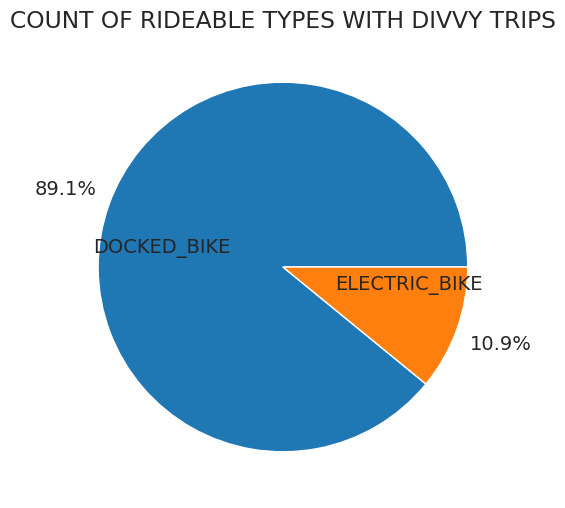

In [51]:
plt.title("COUNT OF RIDEABLE TYPES WITH DIVVY TRIPS")
plt.pie(ride_types_count,labels=['DOCKED_BIKE','ELECTRIC_BIKE'],autopct='%1.1f%%',pctdistance=1.25, labeldistance=.3,);

From the pie chart we can infer that 89.1% prefer docked bike over electric bike in the year 2020.Further [research](https://news.yahoo.com/divvy-bikes-hit-streets-chicago-100000820.html) for the cause showed that E-bikes have been introduced in the last quarter of the year 2020 and the Chicago Department of Transportation is reinvesting in traditional pedal bikes, which are cheaper to rent than e-bikes. E-bikes will remain in use, but no part of the city is limited to only E-bikes.

#### _Member Type_ ####

Member type is a column with values 'member' and 'casual'.

In [52]:
#3)count of type of members
member_types=divvy_trips_df.member_casual.value_counts()
member_types

member    1909303
casual    1077530
Name: member_casual, dtype: int64

In [53]:
divvy_trips_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2986833 entries, 0 to 3410109
Data columns (total 16 columns):
 #   Column              Dtype         
---  ------              -----         
 0   ride_id             object        
 1   rideable_type       category      
 2   started_at          datetime64[ns]
 3   ended_at            datetime64[ns]
 4   start_station_name  object        
 5   start_station_id    float64       
 6   end_station_name    object        
 7   end_station_id      float64       
 8   start_lat           float64       
 9   start_lng           float64       
 10  end_lat             float64       
 11  end_lng             float64       
 12  member_casual       category      
 13  Month               int64         
 14  Distance            float64       
 15  Duration            float64       
dtypes: category(2), datetime64[ns](2), float64(8), int64(1), object(3)
memory usage: 347.5+ MB


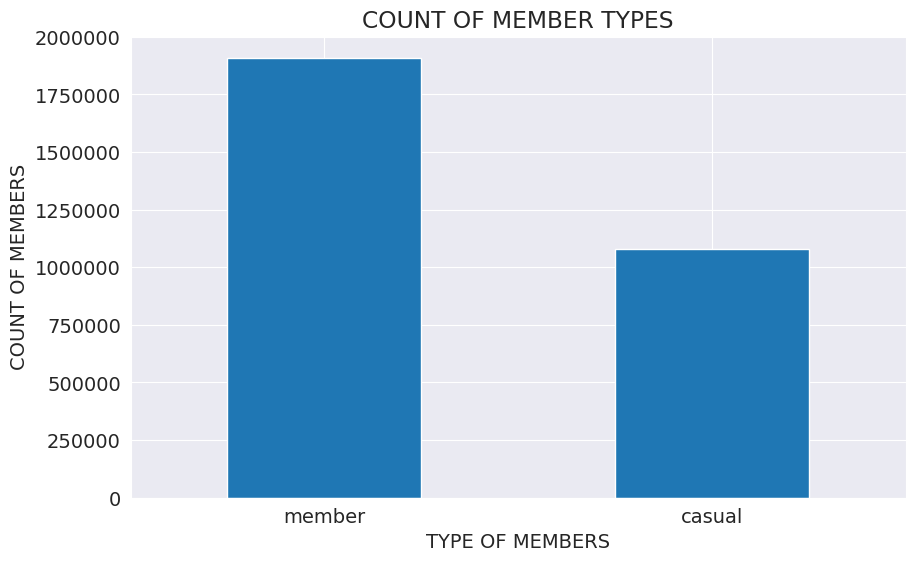

In [54]:
plt.title("COUNT OF MEMBER TYPES")
member_types.plot(kind='bar',rot=0)
plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('TYPE OF MEMBERS')
plt.ylabel('COUNT OF MEMBERS');

From the bar chart it is clearly visible that the most Divvy users prefer subscription model .Hence the people have responded positively towards the prices fixed for each rideable type.63.9 % of the users has the subscription model whereas the 36.1% of the people use it for casual rides.
An annual membership costs `$130.90` and includes free rides up to 45 minutes for regular bikes and discounts on e-bikes. Cyclists who purchase a single ride pay `$1` to unlock the bike, then `$0.17` per minute for a regular bike and `$0.42` per minute for an e-bike.

![Divvy_Price](https://i.imgur.com/WGgU1yw.png)

#### _Distance_ ####

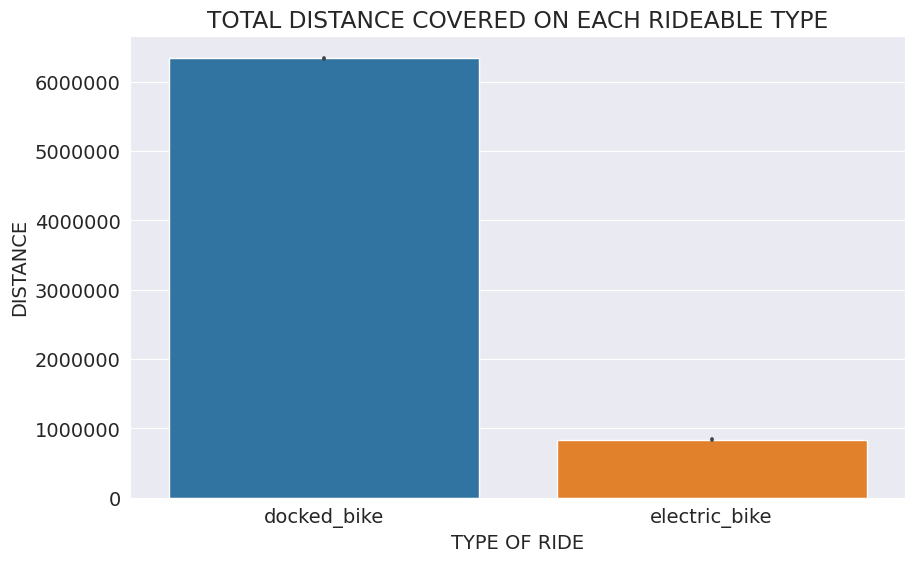

In [55]:
#Distance covered on each rideable type
sns.barplot(data = divvy_trips_df,x='rideable_type',y='Distance',estimator='sum')
plt.xlabel('TYPE OF RIDE')
plt.ylabel('DISTANCE')
plt.title("TOTAL DISTANCE COVERED ON EACH RIDEABLE TYPE")
plt.ticklabel_format(style='plain', axis='y')

The total distance covered over docked bike is 4 times higher than that covered over electric bike.The expense of e-bikes has been a sticking point in some communities for reduced usage and the late introdution towards the last quarter of the year 2020.

#### _Coordinates_ ####

Let us plot a scatter plot to understand the shape of the area covered under the divvy bike sharing  system and the density of the usage across the plot using  the latitude as the x axis of the plot and longitude as the y axis of the plot.

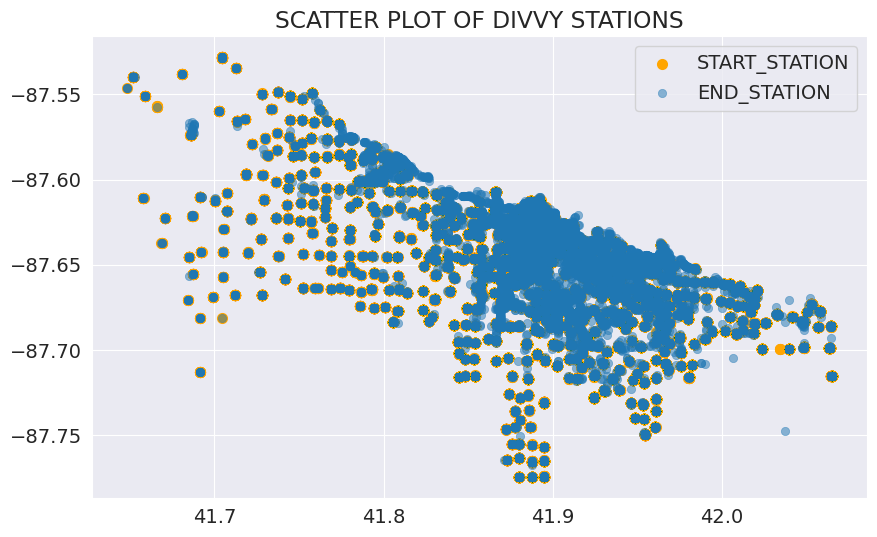

In [56]:
plt.title("SCATTER PLOT OF DIVVY STATIONS")
plt.scatter(divvy_trips_df.start_lat,divvy_trips_df.start_lng,color='orange',linewidths=2)
plt.scatter(divvy_trips_df.end_lat,divvy_trips_df.end_lng,linewidths=0.5,alpha=0.5)
plt.legend(['START_STATION','END_STATION']);

`location` is dataframe that consists of all the stations where divvy bikes are available and there 666 stations available combining the unique ids from both the start_station  and end_stations.[Folium](https://github.com/python-visualization/folium/blob/main/examples/Quickstart.ipynb) is a Python library that enables the creation of interactive Leaflet maps. By default, it creates a map in a separate HTML file, but it can also create inline Jupyter maps. The location of the stations are plotted in a map using folium to identify the distribution of stations across Chicago.

In [57]:
location_start=divvy_trips_df[['start_station_id','start_station_name','start_lat','start_lng']]

A seperate dataframe for start stations `location_start_df` , and end stations `location_end_df` is created and the columns start_station_id and end_station_id is renamed as station_id.

In [58]:
location_start_df=location_start.drop_duplicates(subset='start_station_id')
location_start_df.rename(columns = {'start_station_id':'station_id'},inplace =True)
location_start_df

<ipython-input-58-2e9af0c05a43>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  location_start_df.rename(columns = {'start_station_id':'station_id'},inplace =True)


,station_id,start_station_name,start_lat,start_lng
0,239.0,Western Ave & Leland Ave,41.966500,-87.688400
1,234.0,Clark St & Montrose Ave,41.961600,-87.666000
2,296.0,Broadway & Belmont Ave,41.940100,-87.645500
3,51.0,Clark St & Randolph St,41.884600,-87.631900
4,66.0,Clinton St & Lake St,41.885600,-87.641800
...,...,...,...,...
2784079,725.0,Halsted St & 104th St,41.705171,-87.642454
3163591,715.0,Major Taylor Trail & 124th St,41.668723,-87.637188
3164849,728.0,Western Ave & 111th St,41.691220,-87.681311
3175154,724.0,Homewood Ave & 115th St,41.684578,-87.670792


The start station has 668 rows of columns which indicates 668  unique start  stations

In [59]:
location_drop = divvy_trips_df[['end_station_id','end_station_name','end_lat','end_lng']]

In [60]:
location_drop_df=location_drop.drop_duplicates(subset='end_station_id')
location_drop_df.rename(columns={'end_station_id':'station_id'},inplace=True)
location_drop_df

<ipython-input-60-bc36a9197b6b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  location_drop_df.rename(columns={'end_station_id':'station_id'},inplace=True)


,station_id,end_station_name,end_lat,end_lng
0,326.0,Clark St & Leland Ave,41.967100,-87.667400
1,318.0,Southport Ave & Irving Park Rd,41.954200,-87.664400
2,117.0,Wilton Ave & Belmont Ave,41.940200,-87.653000
3,24.0,Fairbanks Ct & Grand Ave,41.891800,-87.620600
4,212.0,Wells St & Hubbard St,41.889900,-87.634300
...,...,...,...,...
2802673,726.0,Vincennes Ave & 104th St,41.705003,-87.657061
2978968,728.0,Western Ave & 111th St,41.691220,-87.681303
3083818,720.0,Torrence Ave & 126th Pl,41.666312,-87.557216
3188925,715.0,Major Taylor Trail & 124th St,41.668707,-87.637228


There are 668 drop locations that we could filter out from the data we have.The following code checks whether there are any stations that are present in start station but not in drop  on `station_id`.

In [61]:
location=location_start_df[location_start_df['station_id'].isin(location_drop_df['station_id'])]
location.sort_values(by='station_id',ascending=True,inplace =True)
location


,station_id,start_station_name,start_lat,start_lng
6729,2.0,Buckingham Fountain,41.876500,-87.620500
502,3.0,Shedd Aquarium,41.867200,-87.615400
2983,4.0,Burnham Harbor,41.856300,-87.613300
625,5.0,State St & Harrison St,41.874100,-87.627700
1542,6.0,Dusable Harbor,41.887000,-87.612800
...,...,...,...,...
2780174,727.0,Ada St & 113th St,41.687535,-87.655266
3164849,728.0,Western Ave & 111th St,41.691220,-87.681311
2778910,730.0,Lawndale Ave & 111th St,41.691305,-87.712818
2765317,731.0,Bradley Park,41.717911,-87.564622


In [62]:
location.reset_index(drop=True,inplace=True)
location

,station_id,start_station_name,start_lat,start_lng
0,2.0,Buckingham Fountain,41.876500,-87.620500
1,3.0,Shedd Aquarium,41.867200,-87.615400
2,4.0,Burnham Harbor,41.856300,-87.613300
3,5.0,State St & Harrison St,41.874100,-87.627700
4,6.0,Dusable Harbor,41.887000,-87.612800
...,...,...,...,...
663,727.0,Ada St & 113th St,41.687535,-87.655266
664,728.0,Western Ave & 111th St,41.691220,-87.681311
665,730.0,Lawndale Ave & 111th St,41.691305,-87.712818
666,731.0,Bradley Park,41.717911,-87.564622


In [63]:
location.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 668 entries, 0 to 667
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   station_id          668 non-null    float64
 1   start_station_name  668 non-null    object 
 2   start_lat           668 non-null    float64
 3   start_lng           668 non-null    float64
dtypes: float64(3), object(1)
memory usage: 21.0+ KB


`location` is the dataframe that contains the information on all the start stations and the stop stations .There are 668 unique stations.I have plotted the stations across Chicago using folium .

In [64]:
#Map showing the location of various stops across the location
from folium import plugins
from folium.plugins import HeatMap

m=folium.Map(location=[41.876374,-87.620323],zoom_start=13)
for i in range(1,len(location.start_lat)):
     folium.Marker(location=[location.start_lat[i],location.start_lng[i]],
                   popup= location.start_station_name[i] +" "+ '{:02d}'.format(i),
                   icon=folium.Icon(color='blue',icon='location')).add_to(m)

m


#### _Start Station Analysis_ ####

In [65]:
usage_by_stations=divvy_trips_df.start_station_name.value_counts()
top_20_most_used_stations=usage_by_stations[:20]
top_20_most_used_stations

Streeter Dr & Grand Ave           28226
Clark St & Elm St                 28081
Theater on the Lake               25128
Wells St & Concord Ln             22684
Lake Shore Dr & North Blvd        22611
Lake Shore Dr & Monroe St         22239
Broadway & Barry Ave              21983
Dearborn St & Erie St             21286
Kingsbury St & Kinzie St          20827
Clark St & Armitage Ave           20721
Millennium Park                   20540
Wells St & Huron St               20470
Columbus Dr & Randolph St         20124
Wells St & Elm St                 19954
Desplaines St & Kinzie St         19851
Lake Shore Dr & Wellington Ave    19751
Clark St & Lincoln Ave            19558
Indiana Ave & Roosevelt Rd        19323
St. Clair St & Erie St            19226
Michigan Ave & Oak St             18929
Name: start_station_name, dtype: int64

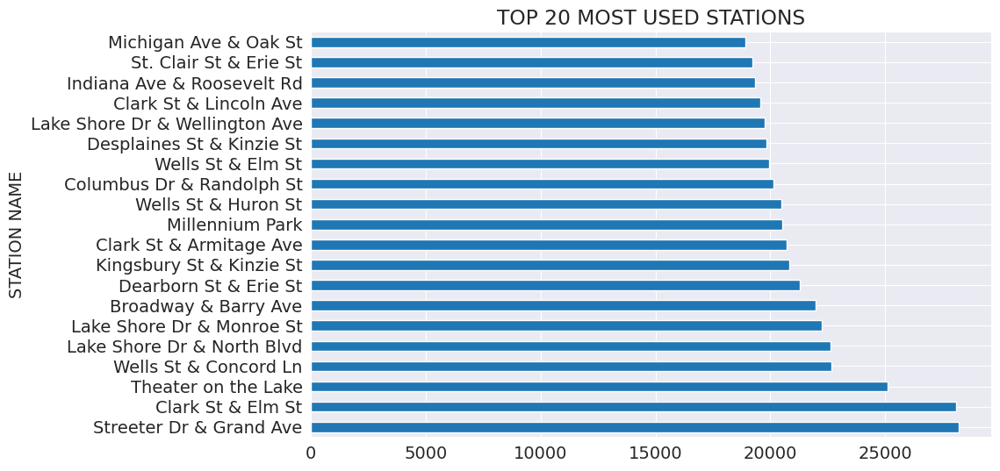

In [66]:
plt.title("TOP 20 MOST USED STATIONS")
plt.xlabel('COUNT')
plt.ylabel('STATION NAME')
top_20_most_used_stations.plot(kind='barh');

The horizontal barchart displays the most used stations along with the count of trips which statrted from these stations.Streeter Dr & Grand Ave is busiest station of Divvy.

In [67]:
usage_by_stations

Streeter Dr & Grand Ave       28226
Clark St & Elm St             28081
Theater on the Lake           25128
Wells St & Concord Ln         22684
Lake Shore Dr & North Blvd    22611
                              ...  
Stewart Ave & 63rd St (*)         3
Dodge Ave & Main St               3
Western Ave & 104th St            1
HQ QR                             1
Hegewisch Metra Station           1
Name: start_station_name, Length: 686, dtype: int64

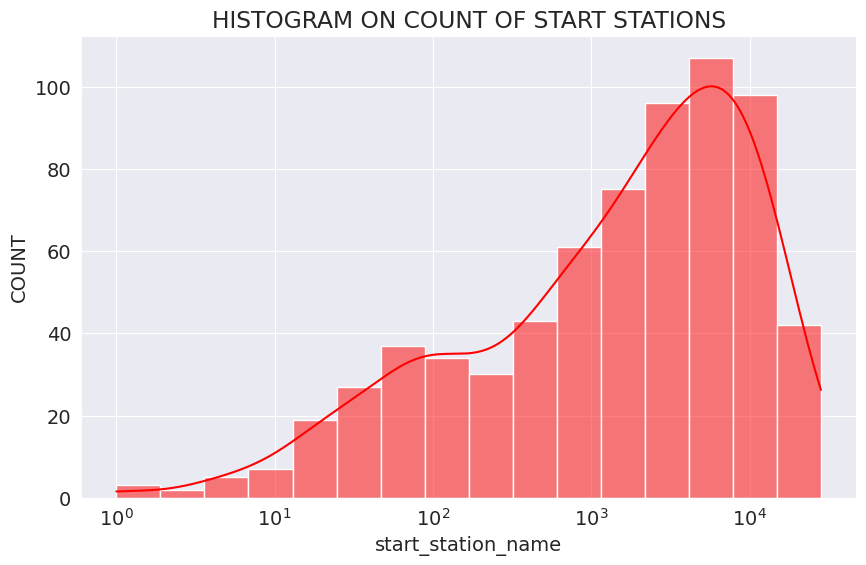

In [68]:
sns.histplot(usage_by_stations,color='red',kde=True,log_scale=True)
plt.ylabel('COUNT')
plt.title("HISTOGRAM ON COUNT OF START STATIONS");

The histogram shows the distribution of number of stations within  the range of value counts along the x axis of the power (10^0) to (10^4).The peak shows there are more than 280 stations where the overall use in the year is of the power in between (10^3) and (10^4).There are a few stations where the overall count of rides is less than 10.This may be because the stations are new and the people are not familiar with the usage .

In [69]:
#Need to check why it is least used and find the reason to improve the reach of diivy bikes
least_used_stations = usage_by_stations[usage_by_stations < 10 ]
least_used_stations

Vincennes Ave & 104th St         9
Lawndale Ave & 111th St          7
Torrence Ave & 126th Pl          7
Ashland Ave & 73rd St            7
Wentworth Ave & 104th St         6
Western Ave & 111th St           5
Major Taylor Trail & 124th St    5
Eggleston Ave & 69th St (*)      5
Homewood Ave & 115th St          4
Stewart Ave & 63rd St (*)        3
Dodge Ave & Main St              3
Western Ave & 104th St           1
HQ QR                            1
Hegewisch Metra Station          1
Name: start_station_name, dtype: int64

In [70]:
percentage_least_used = len(least_used_stations)/len(usage_by_stations)
percentage_least_used

0.02040816326530612

Less 2 %  of the stations are rarely used .The count of usage of the least used stations is assumed to be less than 10. In order to resolve this problem over the years Divvy plans to celebrate the new stations, Divvy plans to host pop-up events at the stations, where Divvy outreach leaders will be available to answer questions about how to use the bike share system and hand out free passes for neighbors to try the bikes. The Divvy team  announces these events in their email newsletter and on social media.

#### _Started At_ ####

In [71]:
  # most used time
hour = divvy_trips_df.started_at.dt.hour
hour.value_counts()

17    320331
16    270436
18    269970
15    224086
14    202231
13    198291
12    192535
19    190694
11    162733
8     143122
10    126292
20    122095
7     120534
9     115211
21     79574
6      67049
22     60888
23     43604
0      24104
5      21333
1      14059
2       7619
4       5611
3       4431
Name: started_at, dtype: int64

<ipython-input-72-648de57a03d1>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(hour,bins=24,norm_hist=True,kde=False,color='green');


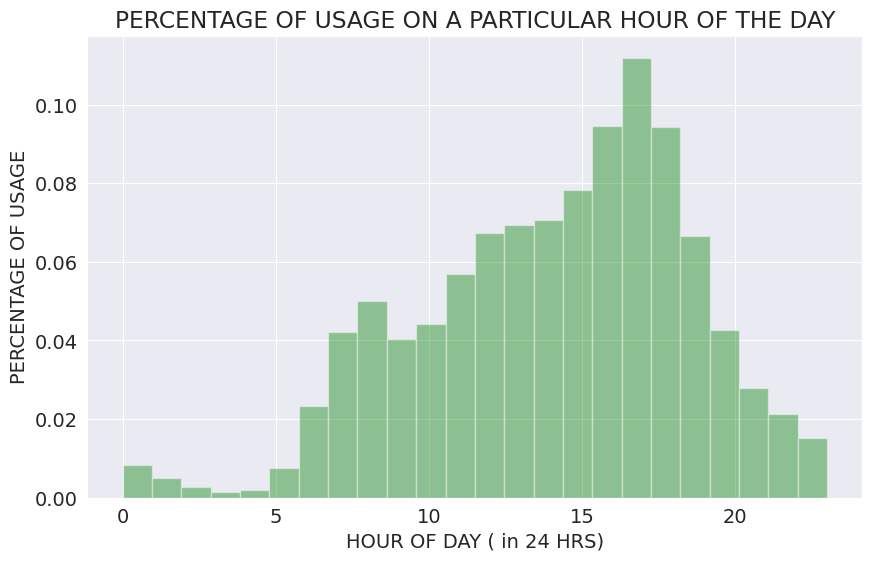

In [72]:
sns.distplot(hour,bins=24,norm_hist=True,kde=False,color='green');
plt.xlabel('HOUR OF DAY ( in 24 HRS)')
plt.ylabel('PERCENTAGE OF USAGE')
plt.title("PERCENTAGE OF USAGE ON A PARTICULAR HOUR OF THE DAY");

From the histogram ,we can infer that the most people use divvy_bikes around 14 hrs and 18 hrs where most people return home from work ,college ,or most people go out wih their family.

In [73]:
# most used day of the month
day=divvy_trips_df.started_at.dt.day
day

0          21
1          30
2           9
3           6
4          30
           ..
3410104    29
3410105    20
3410106     2
3410107     7
3410109     7
Name: started_at, Length: 2986833, dtype: int64

Text(0.5, 1.0, 'USAGE ON DAY OF MONTH')

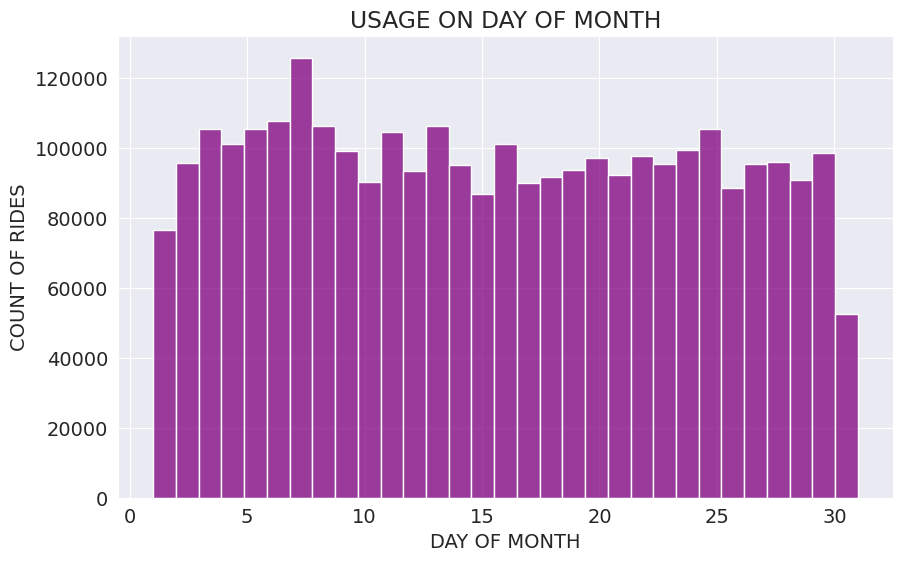

In [74]:
#HISTOGRAM SHOWING  USAGE ALONG A MONTH
sns.histplot(day,bins=31,color='purple')
plt.xlabel('DAY OF MONTH')
plt.ylabel('COUNT OF RIDES')
plt.title("USAGE ON DAY OF MONTH")

The usage of divvy_rides have been uneven across the day of month and hence we cannot identify any particular pattern in usage.But the data available on the month end has unusually very low and hence need to identify the reason for this behaviour.

Return the day of the week. It is assumed the week starts on Monday, which is denoted by 0 and ends on Sunday which is denoted by 6. This method is available on both Series with datetime values (using the dt accessor) or [DatetimeIndex](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DatetimeIndex.dayofweek.html).

In [75]:
# most used day of the week
day_of_week = divvy_trips_df.started_at.dt.dayofweek
day_of_week

0          1
1          3
2          3
3          0
4          3
          ..
3410104    6
3410105    4
3410106    0
3410107    5
3410109    5
Name: started_at, Length: 2986833, dtype: int64

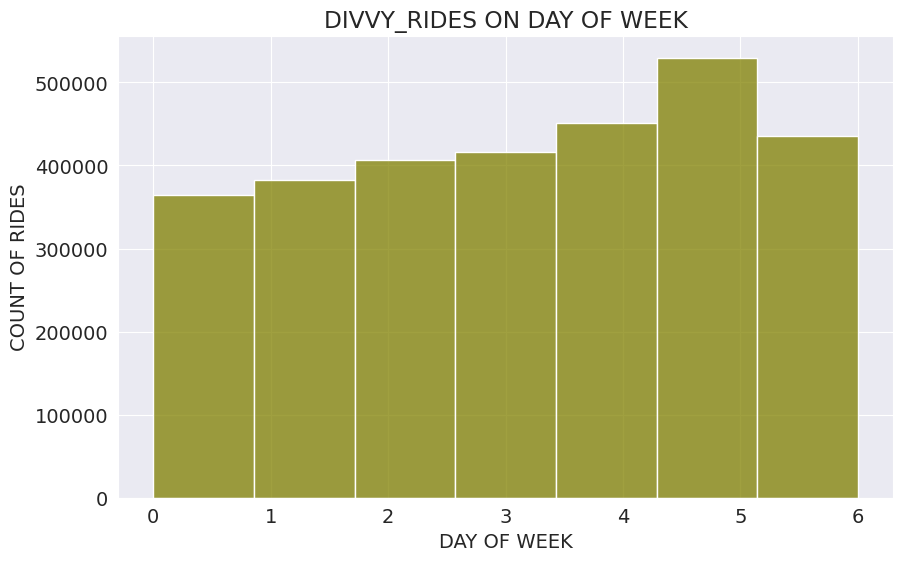

In [76]:
sns.histplot(day_of_week,bins=7,color='olive')
plt.xlabel('DAY OF WEEK')
plt.ylabel('COUNT OF RIDES')
plt.title("DIVVY_RIDES ON DAY OF WEEK");

From the graph  it can be concluded that the most hottest day in demand for divvy_rides are `Saturdays`.Let us check further to analyse whether the pattern of usage along the weekdays and weekends are the same.

In [77]:
# usage in the weekend
saturday_hour=divvy_trips_df.started_at[divvy_trips_df.started_at.dt.dayofweek==5].dt.hour

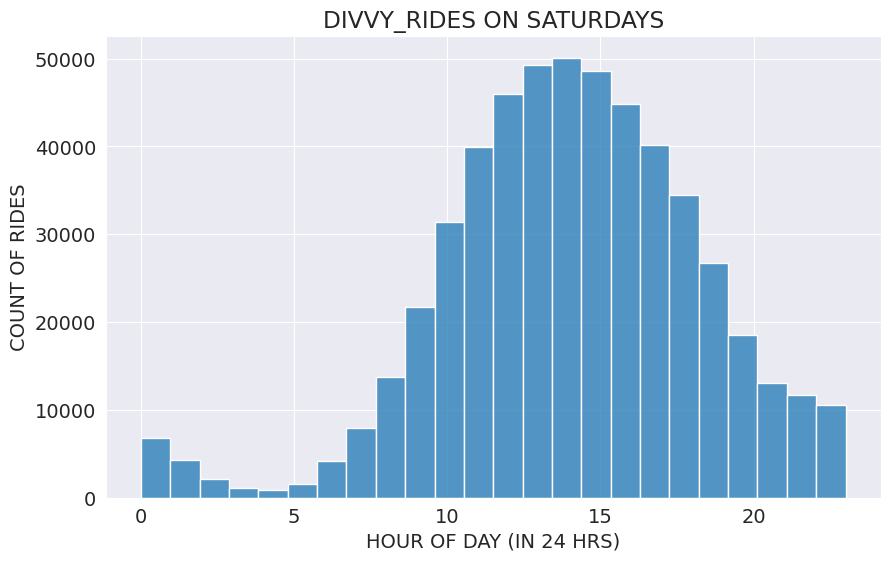

In [78]:
sns.histplot(saturday_hour,bins=24,)
plt.xlabel('HOUR OF DAY (IN 24 HRS)')
plt.ylabel('COUNT OF RIDES')
plt.title("DIVVY_RIDES ON SATURDAYS");

In [79]:
# usage in the weekdays
monday_hour=divvy_trips_df.started_at[divvy_trips_df.started_at.dt.dayofweek==0].dt.hour

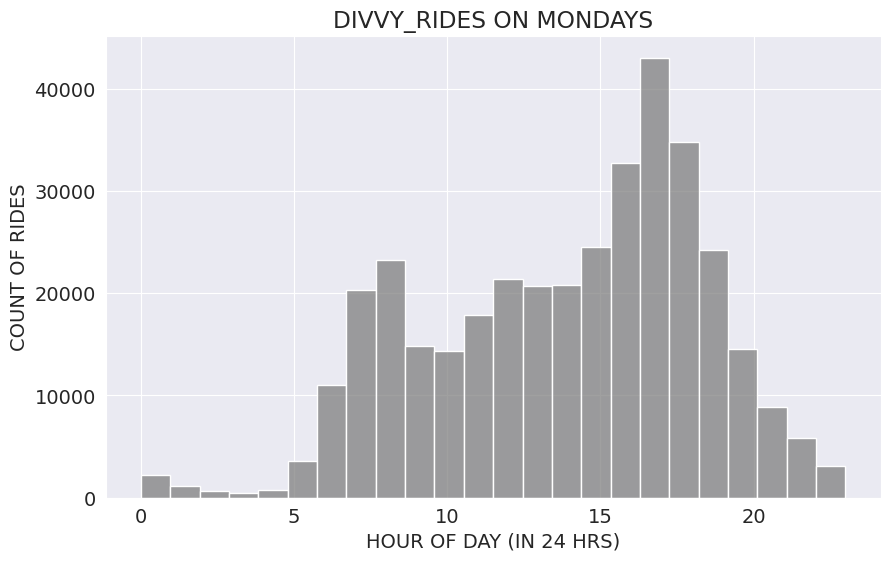

In [80]:
sns.histplot(monday_hour,bins=24,color='grey')
plt.xlabel('HOUR OF DAY (IN 24 HRS)')
plt.ylabel('COUNT OF RIDES')
plt.title("DIVVY_RIDES ON MONDAYS");

The two graphs gives two different peaks along the hours of the day .The usage along the saturdays gives a bell shaped curve that peaks at 13 to 15 hrs while on the weekdays  the graph has two unequal peaks at 8 hrs and 17 hrs .

#### _Rideable Type_ ####

`divvy_electric` and `divvy_docked` are two dataframes that are used to analyse the five number summary of each dataframe through box plots and improve the understanding on rideable_type of the data available to us .

In [81]:
divvy_electric = divvy_trips_df[divvy_trips_df.rideable_type == 'electric_bike']
divvy_electric.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,Month,Distance,Duration
1056619,FCC5AF1EE6C90556,electric_bike,2020-07-31 09:02:32,2020-07-31 09:08:02,Southport Ave & Waveland Ave,227.0,Broadway & Sheridan Rd,256.0,41.948101,-87.664004,41.952773,-87.650284,member,7,1.248318,5.500000
1056620,D250FDFE9547D37D,electric_bike,2020-07-31 10:33:04,2020-07-31 10:36:40,Broadway & Sheridan Rd,256.0,Halsted St & Roscoe St,299.0,41.952835,-87.650050,41.943737,-87.648974,member,7,1.015954,3.600000
1056621,518886FA68C576E7,electric_bike,2020-07-31 08:24:40,2020-07-31 08:31:08,Broadway & Sheridan Rd,256.0,Southport Ave & Waveland Ave,227.0,41.952801,-87.650040,41.948261,-87.664000,member,7,1.260429,6.466667
1057251,C567E225898542DD,electric_bike,2020-07-31 13:14:47,2020-07-31 13:21:17,Calumet Ave & 18th St,338.0,Wabash Ave & 16th St,72.0,41.857687,-87.619427,41.860265,-87.625791,member,7,0.600211,6.500000
1057252,35B9C123ADCD865E,electric_bike,2020-07-31 07:05:09,2020-07-31 07:13:30,Ashland Ave & Chicago Ave,350.0,Ashland Ave & Augusta Blvd,30.0,41.895914,-87.667840,41.899580,-87.668511,member,7,0.411515,8.350000


In [82]:
divvy_docked = divvy_trips_df[divvy_trips_df.rideable_type == 'docked_bike']
divvy_docked.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,Month,Distance,Duration
0,EACB19130B0CDA4A,docked_bike,2020-01-21 20:06:59,2020-01-21 20:14:30,Western Ave & Leland Ave,239.0,Clark St & Leland Ave,326.0,41.9665,-87.6884,41.9671,-87.6674,member,1,1.738045,7.516667
1,8FED874C809DC021,docked_bike,2020-01-30 14:22:39,2020-01-30 14:26:22,Clark St & Montrose Ave,234.0,Southport Ave & Irving Park Rd,318.0,41.9616,-87.6660,41.9542,-87.6644,member,1,0.833672,3.716667
2,789F3C21E472CA96,docked_bike,2020-01-09 19:29:26,2020-01-09 19:32:17,Broadway & Belmont Ave,296.0,Wilton Ave & Belmont Ave,117.0,41.9401,-87.6455,41.9402,-87.6530,member,1,0.620631,2.850000
3,C9A388DAC6ABF313,docked_bike,2020-01-06 16:17:07,2020-01-06 16:25:56,Clark St & Randolph St,51.0,Fairbanks Ct & Grand Ave,24.0,41.8846,-87.6319,41.8918,-87.6206,member,1,1.231623,8.816667
4,943BC3CBECCFD662,docked_bike,2020-01-30 08:37:16,2020-01-30 08:42:48,Clinton St & Lake St,66.0,Wells St & Hubbard St,212.0,41.8856,-87.6418,41.8899,-87.6343,member,1,0.783870,5.533333


In [83]:
divvy_trips_df.rideable_type.value_counts()

docked_bike      2660834
electric_bike     325999
Name: rideable_type, dtype: int64

In [84]:
divvy_electric[['Distance','Duration']].describe()

,Distance,Duration
count,325999.000000,325999.000000
mean,2.575051,16.688171
std,2.263956,17.868620
min,0.000019,0.016667
25%,1.046551,6.516667
50%,1.950541,11.250000
75%,3.481813,19.916667
max,29.033215,348.633333


In [85]:
divvy_electric[['Distance','Duration']].describe()

,Distance,Duration
count,325999.000000,325999.000000
mean,2.575051,16.688171
std,2.263956,17.868620
min,0.000019,0.016667
25%,1.046551,6.516667
50%,1.950541,11.250000
75%,3.481813,19.916667
max,29.033215,348.633333


The negative value of the duartion is not possible .Hence we need to check the location of possible errors in our dataset and the possible reason for many outliers in the duartion .

The distance of the power e-6 is negligible movement of the vehicle hence we can ignore the value and remove the row from the dataset .We round the series and plot the boxplot to compare the distance of two rideable type.

In [86]:
distance_electric = divvy_electric.Distance
distance_docked =divvy_docked.Distance

In [87]:
#Boxplot for electric_bikes
fig=px.box(x=round(distance_electric,ndigits=1))
fig.update_layout(
    title="BOXPLOT ELECTRIC_BIKES",
    xaxis_title="DISTANCE(in KM)",
    )

Here is the screenshot for the above block of codes for Electric_Bikes.Run the notebook to see the output for this Plotly figure.
![BOXPLOT ELECTRIC_BIKES](https://i.imgur.com/6NyKIqX.png)

In [88]:
#Boxplot for docked bikes
fig=px.box(x=round(distance_docked,ndigits=1))
fig.update_layout(
    title="BOXPLOT DOCKED_BIKES",
    xaxis_title="DISTANCE(in KM)",
    )

Here is the screenshot for the above block of codes for Docked_Bikes.Run the notebook to see the output.
![Docked_Bikes](https://i.imgur.com/m7q0Kxj.png)

The median distance  of the docked bikes are higher than the electric bikes and this might be due to the less number of electric bikes available for commute or the user might need the bike for a longer duration or to cover a longer distance which the electric bike might fail to do.

The data for electric bikes is not available for the first three quarters of the year 2020 .From the line graph we can infer that the average duration of each trip  is lowest in the month of January for docked bikes and in the month of December for Electric Bikes.

The month of January and February of 2020 has the lowest average distance for docked bikes .This can be due to the weather conditions of chicago where December , January and February are the coldest months of the year.The snow covered roads might make the commutation by Divvy bikes difficult.

## _Asking and Answering Questions_ ##

##### _Q1) Which is the most preffered rideable_type by divvy_users in  2020?_ #####

In [89]:
count_of_rideableType=divvy_trips_df.rideable_type.value_counts()
count_of_rideableType

docked_bike      2660834
electric_bike     325999
Name: rideable_type, dtype: int64

Since the electric bikes have been introduced in the last quarter of 2020,let us calculate the average of the rideable  type to decide the most preferred one.

In [90]:
Average_docked = count_of_rideableType[0]/12
Average_electric = count_of_rideableType[1]/3
print("Average of docked:",Average_docked)
print("Average of electric:",Average_electric)

Average of docked: 221736.16666666666
Average of electric: 108666.33333333333


From the average we can observe that the docked bikes is the most preferred in the year 2020.

##### _Q2) Do users prefer subscription over  Single Casual use  ?_ #####




In [91]:
count_of_usertype=divvy_trips_df.member_casual.value_counts()
count_of_usertype

member    1909303
casual    1077530
Name: member_casual, dtype: int64

We know that the dataframe we are studying has 2986833 rows of data after cleaning.

In [92]:
total_users =2986833
percentage_member=count_of_usertype[1]/total_users
percentage_subscription=count_of_usertype[0]/total_users
print('Percentage of users with subscription',percentage_subscription)
print('Percentage of users with single_member',percentage_member)

Percentage of users with subscription 0.6392399575068308
Percentage of users with single_member 0.3607600424931692


From the graph for the column rideable type it is clear that the percentage of users with membership is more than the single casual users .A single Casual use could be like `$10`, `$11`, `$12` dollars but if you get a membership, it’s like, `$3`. And it’s faster and easier than going all the way in on the Blue Line trying to take a bus.

##### _Q3) Heat map of the various stations by usage ?_ #####

In [93]:
#Heat map for the sample since the RAM  crashes for entire data each time
lat_list=list(divvy_trips_sample.start_lat)
lng_list=list(divvy_trips_sample.start_lng)
HeatMap(zip(lat_list,lng_list)).add_to(m)
m

From the heatmap we can infer that the maximum usage occur across the coast .Hence need further research to understand the exact reason the people use the divvy bikes for . Spots popular with tourists such as downtown and the lakefront are still busy riding locations, but less touristy areas have picked up in popularity.We can get to know the station_id and station_name by hovering over the Icon in the map.

##### _Q4) Which are the top 5 stations by usage ?_ #####

In [94]:
divvy_trips_df.start_station_name.value_counts()[:5]

Streeter Dr & Grand Ave       28226
Clark St & Elm St             28081
Theater on the Lake           25128
Wells St & Concord Ln         22684
Lake Shore Dr & North Blvd    22611
Name: start_station_name, dtype: int64

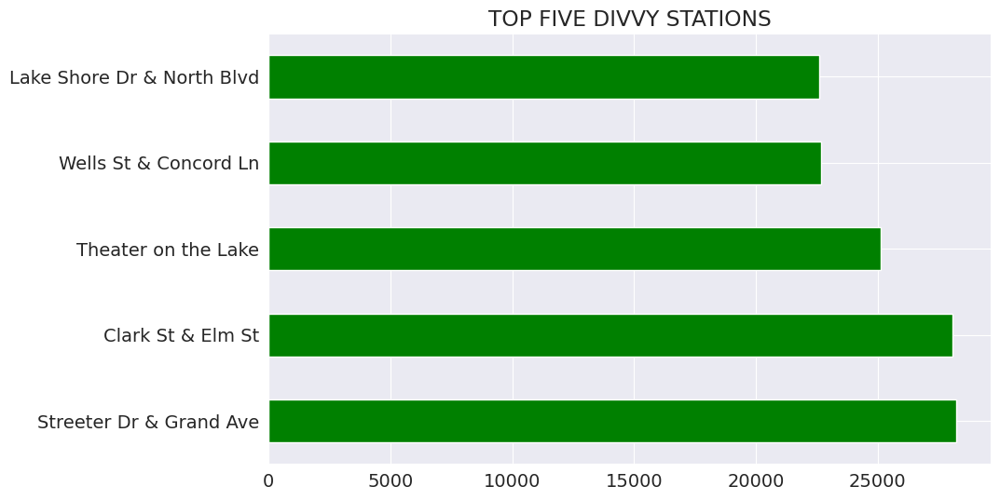

In [95]:
divvy_trips_df.start_station_name.value_counts()[:5].plot(kind='barh',color='green')
plt.title('TOP FIVE DIVVY STATIONS');

`Streeter Dr & Grand Ave` ,`Clark St & Elm St` ,`Theater on the Lake` ,`Wells St & Concord Ln`,`Lake Shore Dr & North Blvd` are  the top stations by usage .During the pandemic, ridership shifted to city neighborhoods. Spots popular with tourists such as downtown and the lakefront are still busy riding locations, but less touristy areas have picked up in popularity.

##### _Q5) Which is the busiest time and Days?_ #####

In [96]:
divvy_trips_df.started_at.dt.hour.value_counts()

17    320331
16    270436
18    269970
15    224086
14    202231
13    198291
12    192535
19    190694
11    162733
8     143122
10    126292
20    122095
7     120534
9     115211
21     79574
6      67049
22     60888
23     43604
0      24104
5      21333
1      14059
2       7619
4       5611
3       4431
Name: started_at, dtype: int64

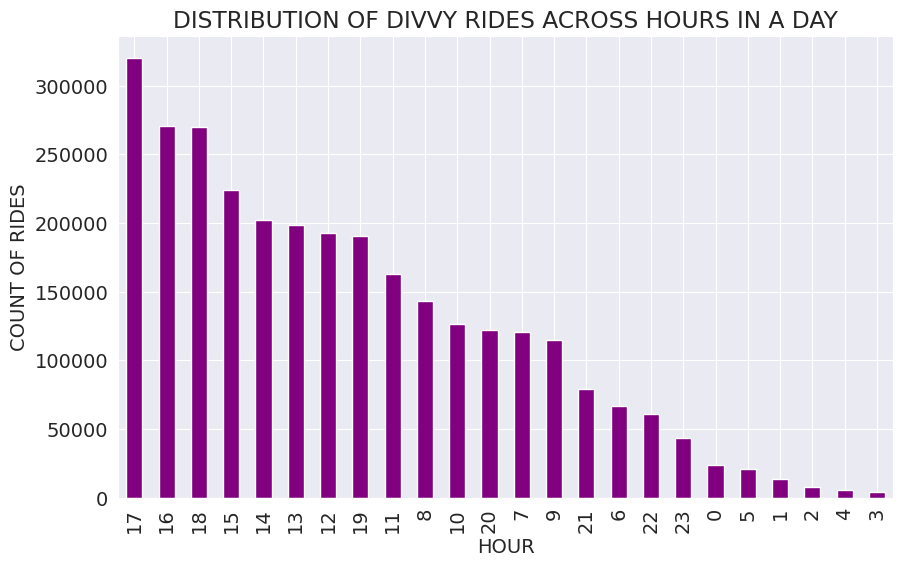

In [97]:
divvy_trips_df.started_at.dt.hour.value_counts().plot(kind='bar',color='purple')
plt.title('DISTRIBUTION OF DIVVY RIDES ACROSS HOURS IN A DAY')
plt.xlabel('HOUR')
plt.ylabel('COUNT OF RIDES');

We can see that the maximum usage comes in the evening.The bikes are one option for commuters to reach and come back from offices , but they have also been used by tourists, residents heading out for errands or social outings and recreational riders hence we have the maximum utilisation in the evening.

In [98]:
divvy_trips_df.started_at.dt.day.value_counts()

7     125864
6     107736
8     106305
13    106304
3     105496
5     105486
25    105435
11    104527
4     101287
16    101265
24     99580
9      99079
30     98738
22     97639
20     97116
28     96071
2      95838
23     95413
27     95326
14     95171
19     93752
12     93375
21     92278
18     91692
29     91012
10     90425
17     90031
26     88699
15     86779
1      76631
31     52483
Name: started_at, dtype: int64

In [99]:
fig=px.bar(divvy_trips_df.started_at.dt.day.value_counts())
fig.update_layout(xaxis_title='DAY OF MONTH', yaxis_title='COUNT OF RIDES',title='DISTRIBUTION OF RIDES ACROSS DAYS OF A MONTH',showlegend=False)
fig.show()

The first two weeks of the month have the maximum usage ,this may be because the last is usually the busiest part of the month when it comes to  work .The people have salary in the beginning of the month where they spent on entertainment and exploring more.

##### _Q6)Which is the busiest part of day of week?_ #####

In [100]:
divvy_trips_df.started_at.dt.dayofweek.value_counts()

5    529724
4    451715
6    435282
3    415758
2    406887
1    382414
0    365053
Name: started_at, dtype: int64

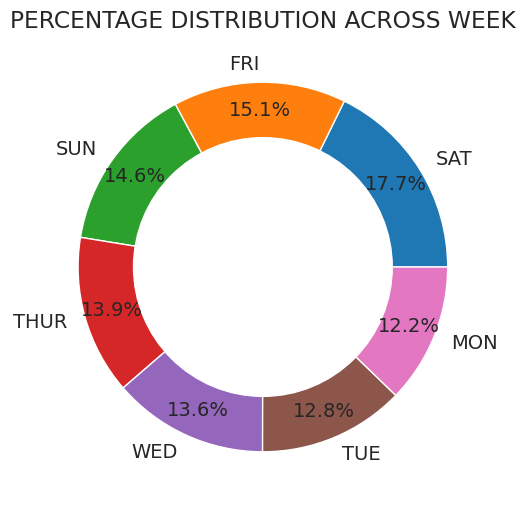

In [101]:
labels=['SAT','FRI','SUN','THUR','WED','TUE','MON']
plt.pie(divvy_trips_df.started_at.dt.dayofweek.value_counts(),autopct='%1.1f%%', pctdistance=0.85,labels=labels
        )
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.title('PERCENTAGE DISTRIBUTION ACROSS WEEK');

 The day of the week with Monday=0, Sunday=6. It is assumed the week starts on Monday, which is denoted by 0 and ends on Sunday which is denoted by 6. Hence we can see that divvy_users are the highest on Saturdays denoted by 5 followed by Friday denoted by 4 and Sunday denoted by 6.

##### _Q7) Which is the busiest hour on a weekend ?_ #####

In [102]:
divvy_trips_df.started_at[divvy_trips_df.started_at.dt.dayofweek==0].dt.hour.value_counts()

17    43037
18    34782
16    32748
15    24531
19    24236
8     23281
12    21409
14    20785
13    20742
7     20327
11    17832
9     14844
20    14517
10    14310
6     10985
21     8837
22     5845
5      3549
23     3132
0      2197
1      1185
4       784
2       686
3       472
Name: started_at, dtype: int64

In the weekends the maximum usage occurs during the evening in between 17 to 19 hours.

##### _Q8) Which month has the lowest average distance covered?_ #####

In [103]:
# Tree map showing the number of rideable type based on the type of members for the year 2020
fig=px.treemap(divvy_trips_df,
               path=['Month','member_casual','rideable_type'],
               color='Distance',
               color_continuous_scale='RdBu',
               title='MONTHWISE DISTRIBUTION OF RIDEABLE TYPE FOR EACH MEMBER TYPE'
               )
fig.show()

The month of `January` and `February` of 2020 has the lowest average distance for docked bikes .This can be due to the weather conditions of chicago where December , January and February are the coldest months of the year.The snow covered roads might make the commutation by Divvy bikes difficult.

##### _Q9) Which month has the lowest average duration of trips ?_ #####

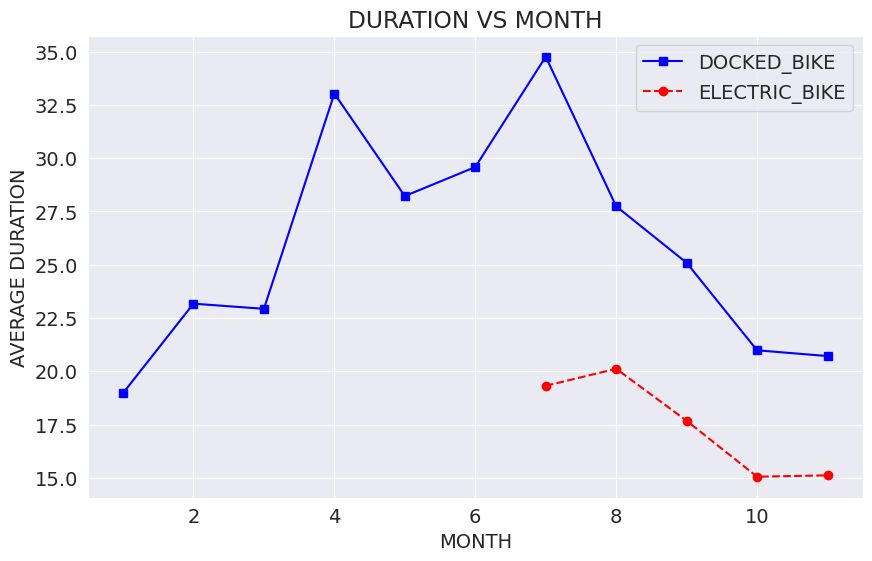

In [104]:
plt.plot(divvy_docked.Duration.groupby(by=divvy_trips_df.Month).mean(),'s-b')
plt.plot(divvy_electric.Duration.groupby(by=divvy_trips_df.Month).mean(),'o--r')
plt.xlabel('MONTH')
plt.ylabel('AVERAGE DURATION')
plt.title("DURATION VS MONTH")
plt.legend(['DOCKED_BIKE', 'ELECTRIC_BIKE']);

The data for electric bikes is not available for the first three quarters of the year 2020 .From the line graph we can infer that the average duration of each trip is lowest in the month of January for docked bikes and in the month of December for Electric Bikes.

## _Summary_ ##


- The member count is more over casual rides ,63.9 % of the users has the subscription model whereas the 36.1% of the people use it for casual rides.
- Most of the stations are located along the coast and as we move away from the coast the number decreases.
- 0.7 % of the stations are used very less often .
- 89.1% prefer docked bike over electric bike in the year 2020 .
- The following are the top 5 frequently used stations -
  * Streeter Dr & Grand Ave
  * Clark St & Elm St
  * Theater on the Lake
  * Wells St & Concord Ln
  * Lake Shore Dr & North Blvd
- Most usage of the bikes occurs in between 14:00 HRS and 19:00 HRS (probabily people go for a evening ride,return from office )
- The two graphs gives two different peaks along the hours of the day .The usage along the saturdays gives a bell shaped curve that peaks at 13 to 15 hrs while on the weekdays the graph has two unequal peaks at 8 hrs and 17 hrs ,hence we can coclude that the most users comes either use it for commuting to offices or colleges.
- From the heat map we can observe that the stations close to the beach is most often used .The frquency of usage further away from the coast is very low.
- The max distance and duration of all the trips in q4 is 48.3 KM using a docked bike and durations is 6 days using a docked bike.
- The total distance covered by users using docked bikes is more than the electric bike .
- The overall median distance coverd by the docked by is slightly less than the overall median distance of the electric bike .
- The month of January and February of 2020 has the lowest average distance for docked bikes covered under the member type.This can be due to the weather conditions.


## _Conclusion_ ##

Thus Divvy has in many ways become part of the fabric of Chicago. The bikes are one option for commuters to reach offices, but they have also been used by tourists, residents heading out for errands or social outings and recreational riders.Divvy should be working more on “socializing” e-bikes. They present an opportunity to shift more people out of cars and into more environmentally-friendly modes of transportation, but price is still a sticking point. The city should consider subsidizing Divvy e-bikes the way public transit is subsidized to make the cost more attainable .  
Further Divvy  can do better in terms of expanding access, both just where bikes and stations are located, how readily available those bikes and stations are, and then critically how affordable they are.

## _Future Work_ ##

- Calculate the revenue by creating a csv file with rate and converting it into a pandas dataframe and merging it with the existing dataframe.
- Calcuate the revenue from each time of ride and subscription model.
- Intergrate with other quarters data over different and create an EDA for 3-4 year.Analyse the existing data over successive years for overall performance and take necessary steps to rectify the critical flaws if any .
- Integrate with weather data.

## _References_ ##

- [Data Visualization using Python, Matplotlib and Seaborn](https://jovian.com/learn/data-analysis-and-visualization-with-python/lesson/)
- [Interactive Visualization with Plotly](https://jovian.com/learn/data-analysis-and-visualization-with-python/lesson/interactive-visualization-with-plotly-folium)
- [Advanced Data Analysis Techniques with Python & Pandas](https://jovian.com/learn/data-analysis-and-visualization-with-python/lesson/advanced-data-analysis-techniques)
- [Plotting maps using Folium](https://stackoverflow.com/questions/46400769/numbers-in-map-marker-in-folium)
- [Categorical Data](https://pandas.pydata.org/pandas-docs/stable/user_guide/categorical.html)
- [Pandas DateTime](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DatetimeIndex.dayofweek.html)
- [Opendatasets](https://github.com/JovianHQ/opendatasets)
- [Pandas Documentation](https://pandas.pydata.org/docs/)
- [MarkDown](https://github.com/adam-p/markdown-here/wiki/Markdown-Cheatsheet)
- [Seaborn Documentation](https://seaborn.pydata.org/)
- [Matplotlib Documentation](https://matplotlib.org/stable/users/index.html)
